In [3]:
import pandas as pd
from yahoo_fin.stock_info import get_data
import matplotlib.pyplot as plt
import math
import numpy as np
from scipy.optimize import curve_fit

import warnings

# Filter out all warnings
warnings.filterwarnings("ignore")

#!pip install yfinance
#!pip install --upgrade yfinance
#!pip install yahoo_fin

In [301]:
#PAST DJIA
custom_tickers = [
    "^DJI",    # Dow Jones Industrial Average (DJI)
    "^GSPC",   # S&P 500
    "^IXIC",   # NASDAQ Composite
    "^FTSE",   # FTSE 100
    "^RUT",   # RUT
    #"^N225",
    #"^RMCC",
    #"^MID"
]


# Fetch data for each ticker
stock_data = {}
for ticker in custom_tickers:
    try:
        data = get_data(ticker)
        stock_data[ticker] = data
    except AssertionError as e:
        print(f"No data found for {ticker}: {e}")
        
sandp_time = stock_data["^RUT"]

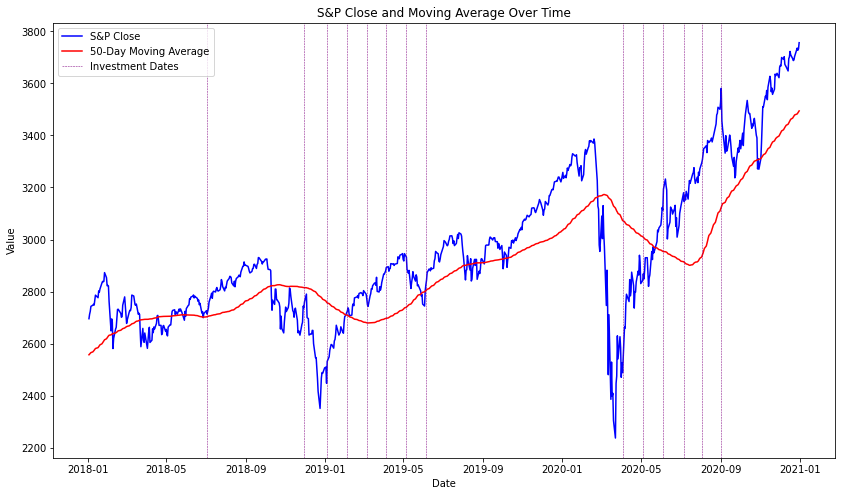

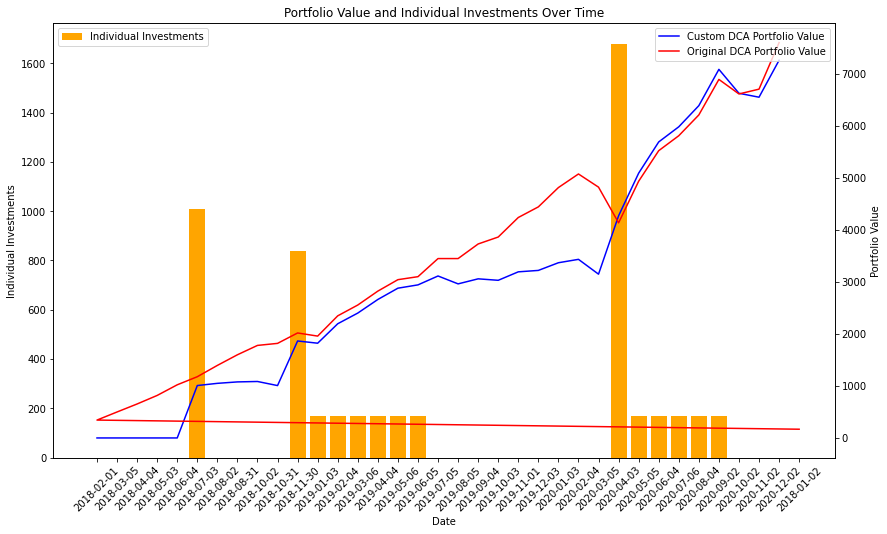

Custom DCA Value:  7264.63339058091
Original DCA Value:  7604.650975624788
Percent (Custom/Original):  95.52882063708462


In [66]:
import pandas as pd
import matplotlib.pyplot as plt

def dca_analysis(sandp_time, moving_average_window, time_interval, training_start_date, training_end_date, testing_start_date, testing_end_date, initial_investment, show_graph):
    sandp_time.index = pd.to_datetime(sandp_time.index)

#     def custom_dca_strategy(df, initial_investment, interval, moving_averages_df):
#         shares_owned = 0
#         portfolio_value = []
#         dates = []
#         investment_history = []
#         remaining_investment = 0

#         for i in range(interval, len(df), interval):
#             current_price = df.iloc[i]['close']
#             ma_value_current = moving_averages_df.iloc[i]
#             ma_value_previous = moving_averages_df.iloc[i - interval]

#             # Determine the slope of the moving average over the interval
#             ma_slope = ma_value_current - ma_value_previous

#             if ma_slope > 0:
#                 # Moving average is positively sloping, invest accumulated funds plus initial investment
#                 total_investment = remaining_investment + initial_investment
#                 remaining_investment = 0  # Reset remaining investment after investing
#             else:
#                 # Moving average is negatively sloping, do not invest, just accumulate
#                 total_investment = 0
#                 remaining_investment += initial_investment

#             shares_bought = total_investment / current_price if total_investment > 0 else 0
#             shares_owned += shares_bought
#             current_value = shares_owned * current_price
#             portfolio_value.append(current_value)
#             dates.append(df.index[i])
#             investment_history.append(total_investment)

#         return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)
    
    def custom_dca_strategy(df, initial_investment, interval, moving_averages_df):
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []
        remaining_investment = 0
        peak_ma = moving_averages_df.iloc[0]  # Initialize peak moving average as the first value
        peak_to_current_drop = 0  # Initialize the drop from peak to current moving average

        for i in range(interval, len(df), interval):
            current_price = df.iloc[i]['close']
            ma_value_current = moving_averages_df.iloc[i]
            ma_value_previous = moving_averages_df.iloc[i - interval]

            # Determine the slope of the moving average over the interval
            ma_slope = ma_value_current - ma_value_previous

            # Update peak moving average if the current moving average is higher
            if ma_value_current > peak_ma:
                peak_ma = ma_value_current
                peak_to_current_drop = 0  # Reset drop from peak to current moving average

            # Calculate the drop from peak moving average to current moving average
            peak_to_current_drop = (peak_ma - ma_value_current) / peak_ma * 100

            if peak_to_current_drop >= 0.00001:
                # Moving average is negatively sloping, and the drop from peak is >= 50%
                total_investment = remaining_investment + initial_investment
                remaining_investment = 0  # Reset remaining investment after investing
            else:

                total_investment = 0
                remaining_investment += initial_investment

            shares_bought = total_investment / current_price
            shares_owned += shares_bought
            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(total_investment)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    
    def original_dca_strategy(df, investment_amount, interval):
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []

        for i in range(0, len(df), interval):
            current_price = df.iloc[i]['close']
            shares_bought = investment_amount / current_price
            shares_owned += shares_bought

            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(investment_amount)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    # Calculate moving averages for the testing dataset
    testing_df = sandp_time[testing_start_date:testing_end_date]
    full_set = sandp_time[training_start_date:testing_end_date]
    moving_averages_test = full_set['close'].rolling(window=moving_average_window).mean()[len(full_set)-len(testing_df):]
    
    # Calculate the investment strategy results on the testing dataset
    custom_result = custom_dca_strategy(testing_df, initial_investment, time_interval, moving_averages_test)
    original_result = original_dca_strategy(testing_df, initial_investment, time_interval)
    
    # Plotting
    if show_graph:
        plt.figure(figsize=(14, 8))
        plt.plot(testing_df.index, testing_df['close'], label='S&P Close', color='blue')
        plt.plot(testing_df.index, moving_averages_test, label='Moving Average', color='red')

        for date in custom_result.index[custom_result['investment_history'] > 0]:
            plt.axvline(x=date, color='purple', linestyle='--', linewidth=0.5, label='Investment Dates' if 'Investment Dates' not in plt.gca().get_legend_handles_labels()[1] else "")

        plt.title('S&P Close and Moving Average Over Time')
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

        # Plot DCA Strategy Performance
        fig, ax1 = plt.subplots(figsize=(14, 8))

        # Plotting the bar plot

    #     ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')
    #     tick_frequency = 3  # Adjust this value according to your preference
    #     ax1.xticks(custom_result.index.strftime('%Y-%m-%d')[::tick_frequency], rotation=45)  

        ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')

        # Creating a second y-axis
        ax2 = ax1.twinx()

        # Plotting the line plots on the second y-axis
        ax2.plot(custom_result.index.strftime('%Y-%m-%d'), custom_result['portfolio_value'], label='Custom DCA Portfolio Value', color='blue')
        ax2.plot(original_result.index.strftime('%Y-%m-%d'), original_result['portfolio_value'], label='Original DCA Portfolio Value', color='red')

        # Adding labels and legend
        ax1.set_title('Portfolio Value and Individual Investments Over Time')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Individual Investments')
        ax2.set_ylabel('Portfolio Value')
        ax1.xaxis.set_tick_params(rotation=45)
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')

        plt.show()

        print("Custom DCA Value: ", custom_result["portfolio_value"][-1])
        print("Original DCA Value: ", original_result["portfolio_value"][-1])
        print("Percent (Custom/Original): ", custom_result["portfolio_value"][-1]/original_result["portfolio_value"][-1]*100)


    return custom_result, original_result

# Define parameters
moving_average = 100
time_interv = 5
training_start_date = '2010-12-31'
training_end_date = '2017-12-31'
testing_start_date = '2018-01-01'
testing_end_date = '2021-01-01'
initial_investment = 8 * time_interv  # Adjust this if needed

final = dca_analysis(sandp_time, moving_average_window=moving_average, time_interval=time_interv, training_start_date=training_start_date, training_end_date=training_end_date, testing_start_date=testing_start_date, testing_end_date=testing_end_date, initial_investment=initial_investment, show_graph=True)


In [288]:
import numpy as np

def make_plots(moving_average=20, increment_years=5, max_val=1.0):
    time_interv = 5
    date_start = '1980-06-01'
    date_end = '2024-06-01'
    test_period_years = 10  # Length of testing period
    final_results = []

    current_year = int(date_start[:4])

    while True:
        training_start_date = f"{current_year:04d}-01-01"
        training_end_date = f"{current_year + increment_years - 1:04d}-12-31"
        testing_start_date = f"{current_year + increment_years:04d}-01-01"
        testing_end_date = f"{current_year + increment_years + test_period_years - 1:04d}-12-31"

        if testing_end_date > date_end:
            break

        result = dca_analysis(
            sandp_time,
            moving_average_window=moving_average,
            time_interval=time_interv,
            training_start_date=training_start_date,
            training_end_date=training_end_date,
            testing_start_date=testing_start_date,
            testing_end_date=testing_end_date,
            initial_investment=8 * time_interv,  # Assuming initial investment based on time interval
            show_graph=True,  # Not showing graphs for now
        )
        final_results.append((training_start_date, training_end_date, testing_start_date, testing_end_date, result))
        current_year += 5

    current = []
    old = []

    for i in range(len(final_results)):
        current.append(final_results[i][4][0]["portfolio_value"][-1])
        old.append(final_results[i][4][1]["portfolio_value"][-1])

    percents = np.array(current)/np.array(old)
    return np.mean(percents)

# Example usage:
# mean_percent = make_plots(moving_average=50, increment_years=5, trendline_multiplier=0.8, max_val=1.0)
mean_percent = make_plots(moving_average=20, increment_years=5, max_val=1.0)
print("Mean Percent: ", mean_percent)

TypeError: dca_analysis() missing 2 required positional arguments: 'slope_val' and 'days_val'

In [6]:
from sklearn.model_selection import ParameterGrid

param_grid = {
    'moving_average': [50, 100, 200, 300, 500],
}

# Generate combinations
param_combinations = ParameterGrid(param_grid)

best_performance = float('-inf')
best_parameters = None

# Iterate over parameter combinations
for params in param_combinations:
    # Run make_plots with current parameters and evaluate performance
    performance = make_plots(**params)
    
    # Update best parameters if current performance is better
    if performance > best_performance:
        best_performance = performance
        best_parameters = params
        print(params)
        print(performance)

print("Best parameters:", best_parameters)
print("Best performance:", best_performance)

NameError: name 'make_plots' is not defined

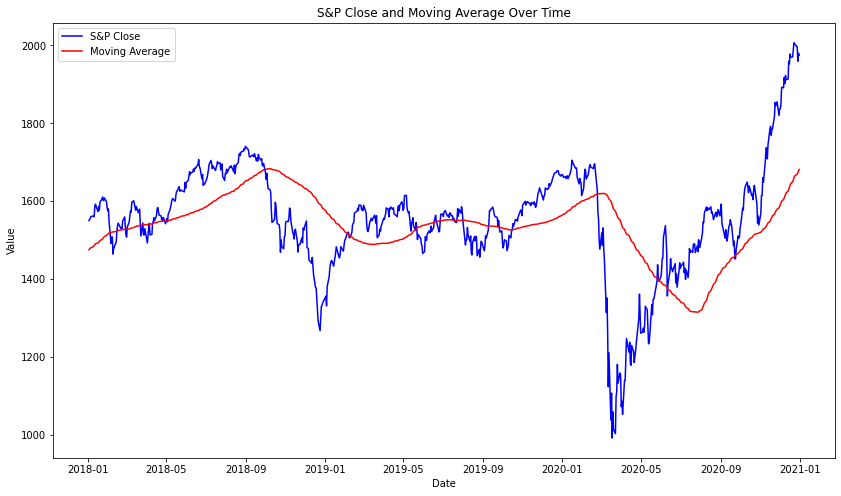

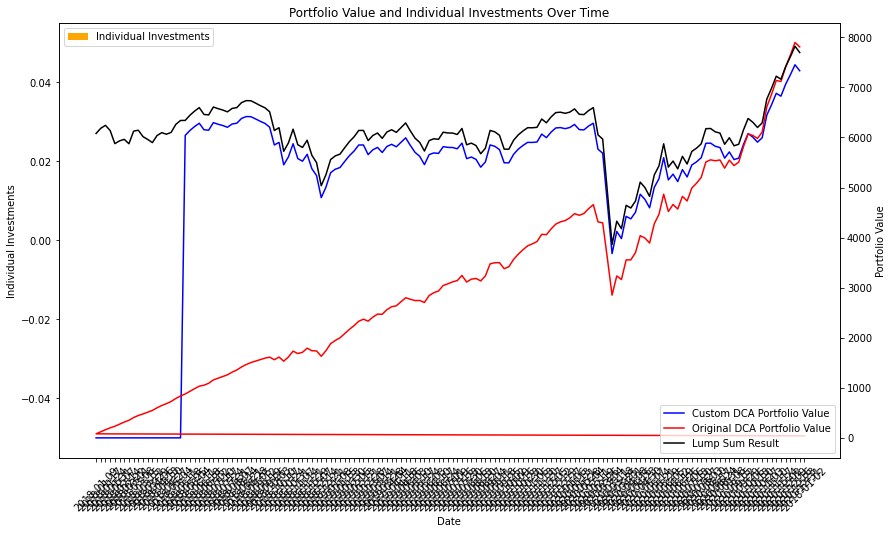

Custom DCA Value:  7331.694613616595
Original DCA Value:  7808.691273157428
Percent (Custom/Original):  93.8914647428754


In [302]:
import pandas as pd
import matplotlib.pyplot as plt

def dca_analysis(sandp_time, moving_average_window, time_interval, training_start_date, training_end_date, testing_start_date, testing_end_date, initial_investment, show_graph):
    sandp_time.index = pd.to_datetime(sandp_time.index)

    
    def lump_sum_strategy(df, initial_investment, interval, moving_averages_df):
        total_investment = len(range(interval, len(df), interval))*initial_investment
        initial_price = df['close'].iloc[0]  # First available closing price at testing start
        shares_owned = total_investment / initial_price  # Total shares bought at once
        portfolio_value = []
        dates = []
        investment_history = []

        for i in range(interval, len(df), interval):
            current_price = df.iloc[i]['close']
            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(0)  # No additional investment made

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    def custom_dca_strategy(df, initial_investment, interval, moving_averages_df):
        initial_in = len(range(interval, len(df), interval))*initial_investment
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []
        remaining_investment = 0
        lump_sum_invested = False
        ma_value_peak = moving_averages_df.iloc[0]
        total_investment = 0

        for i in range(interval, len(df), interval):
            current_price = df.iloc[i]['close']
            ma_value_current = moving_averages_df.iloc[i]
            ma_value_peak = max(ma_value_peak,ma_value_current)

            # Determine the slope of the moving average over the interval
            ma_slope = ma_value_current - ma_value_peak

            if not lump_sum_invested:
                if i >= 100 or (ma_value_current / ma_value_peak <= 0.8 and ma_slope > 0):
                    shares_bought = initial_in / current_price
                    shares_owned += shares_bought
                    current_value = shares_owned * current_price
                    portfolio_value.append(current_value)
                    dates.append(df.index[i])
                    investment_history.append(total_investment)
                    lump_sum_invested = True
                else:
                    total_investment = 0
            else:
                total_investment = 0

            shares_bought = total_investment / current_price if total_investment > 0 else 0
            shares_owned += shares_bought
            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(total_investment)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)
    
    
    def original_dca_strategy(df, investment_amount, interval):
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []

        for i in range(0, len(df), interval):
            current_price = df.iloc[i]['close']
            shares_bought = investment_amount / current_price
            shares_owned += shares_bought

            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(investment_amount)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    # Calculate moving averages for the testing dataset
    testing_df = sandp_time[testing_start_date:testing_end_date]
    full_set = sandp_time[training_start_date:testing_end_date]
    moving_averages_test = full_set['close'].rolling(window=moving_average_window).mean()[len(full_set)-len(testing_df):]
    
    # Calculate the investment strategy results on the testing dataset
    custom_result = custom_dca_strategy(testing_df, initial_investment, time_interval, moving_averages_test)
    original_result = original_dca_strategy(testing_df, initial_investment, time_interval)
    lump_sum_result = lump_sum_strategy(testing_df, initial_investment, time_interval, moving_averages_test)
    
    # Plotting
    if show_graph:
        plt.figure(figsize=(14, 8))
        plt.plot(testing_df.index, testing_df['close'], label='S&P Close', color='blue')
        plt.plot(testing_df.index, moving_averages_test, label='Moving Average', color='red')

        for date in custom_result.index[custom_result['investment_history'] > 0]:
            plt.axvline(x=date, color='purple', linestyle='--', linewidth=0.5, label='Investment Dates' if 'Investment Dates' not in plt.gca().get_legend_handles_labels()[1] else "")

        plt.title('S&P Close and Moving Average Over Time')
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

        # Plot DCA Strategy Performance
        fig, ax1 = plt.subplots(figsize=(14, 8))

        # Plotting the bar plot

    #     ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')
    #     tick_frequency = 3  # Adjust this value according to your preference
    #     ax1.xticks(custom_result.index.strftime('%Y-%m-%d')[::tick_frequency], rotation=45)  

        ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')

        
        # Creating a second y-axis
        ax2 = ax1.twinx()

        # Plotting the line plots on the second y-axis
        ax2.plot(custom_result.index.strftime('%Y-%m-%d'), custom_result['portfolio_value'], label='Custom DCA Portfolio Value', color='blue')
        ax2.plot(original_result.index.strftime('%Y-%m-%d'), original_result['portfolio_value'], label='Original DCA Portfolio Value', color='red')
        ax2.plot(lump_sum_result.index.strftime('%Y-%m-%d'), lump_sum_result['portfolio_value'], label='Lump Sum Result', color='black')

        # Adding labels and legend
        ax1.set_title('Portfolio Value and Individual Investments Over Time')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Individual Investments')
        ax2.set_ylabel('Portfolio Value')
        ax1.xaxis.set_tick_params(rotation=45)
        ax1.legend(loc='upper left')
        ax2.legend(loc='lower right')

        plt.show()

        print("Custom DCA Value: ", custom_result["portfolio_value"][-1])
        print("Original DCA Value: ", original_result["portfolio_value"][-1])
        print("Percent (Custom/Original): ", custom_result["portfolio_value"][-1]/original_result["portfolio_value"][-1]*100)


    return custom_result, original_result, lump_sum_result

# Define parameters
moving_average = 100
time_interv = 5
training_start_date = '2010-12-31'
training_end_date = '2017-12-31'
testing_start_date = '2018-01-01'
testing_end_date = '2021-01-01'
initial_investment = 8 * time_interv  # Adjust this if needed

final = dca_analysis(sandp_time, moving_average_window=moving_average, time_interval=time_interv, training_start_date=training_start_date, training_end_date=training_end_date, testing_start_date=testing_start_date, testing_end_date=testing_end_date, initial_investment=initial_investment, show_graph=True)


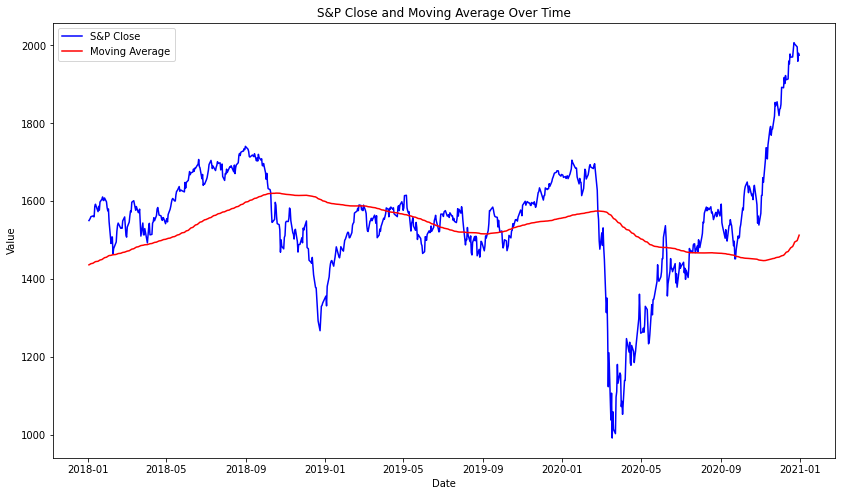

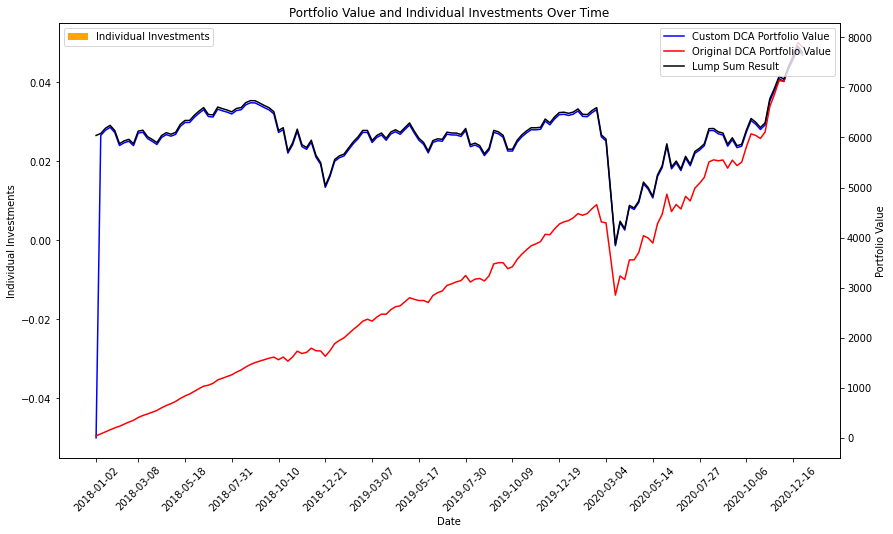

In [303]:
import pandas as pd
import matplotlib.pyplot as plt

def dca_analysis(sandp_time, moving_average_window, time_interval, training_start_date, training_end_date, testing_start_date, testing_end_date, initial_investment, show_graph, slope_val, days_val):
    sandp_time.index = pd.to_datetime(sandp_time.index)

    def lump_sum_strategy(df, initial_investment, interval, moving_averages_df):
        total_investment = len(range(interval, len(df), interval))*initial_investment
        initial_price = df['close'].iloc[0]  # First available closing price at testing start
        shares_owned = total_investment / initial_price  # Total shares bought at once
        portfolio_value = []
        dates = []
        investment_history = []

        for i in range(0, len(df), interval):
            current_price = df.iloc[i]['close']
            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(0)  # No additional investment made

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)
    
    def custom_dca_strategy(df, initial_investment, interval, moving_averages_df):
        initial_in = len(range(interval, len(df), interval))*initial_investment
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []
        remaining_investment = 0
        lump_sum_invested = False
        ma_value_peak = moving_averages_df.iloc[0]
        total_investment = 0
        ma_slope = np.gradient(moving_averages_df)
#         plt.plot(moving_averages_df)
#         plt.show()
#         plt.plot(ma_slope)
#         plt.show()

        days = 0
        for i in range(0, len(df), interval):
            current_price = df.iloc[i]['close']

            if not lump_sum_invested:
                #print(i, ma_slope[i], days)
                if i >= 1000 or ((ma_slope[i] > slope_val) and days >= days_val):
                    shares_bought = initial_in / current_price
                    shares_owned += shares_bought
                    current_value = shares_owned * current_price
                    portfolio_value.append(current_value)
                    dates.append(df.index[i])
                    investment_history.append(total_investment)
                    lump_sum_invested = True
                    days = 0
                else:
                    if (ma_slope[i] > 0):
                        days += 1
                    else:
                        days = 0
                    total_investment = 0
            else:
                total_investment = 0

            shares_bought = total_investment / current_price if total_investment > 0 else 0
            shares_owned += shares_bought
            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(total_investment)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    
    def original_dca_strategy(df, investment_amount, interval):
        shares_owned = 0
        portfolio_value = []
        dates = []
        investment_history = []

        for i in range(0, len(df), interval):
            current_price = df.iloc[i]['close']
            shares_bought = investment_amount / current_price
            shares_owned += shares_bought

            current_value = shares_owned * current_price
            portfolio_value.append(current_value)
            dates.append(df.index[i])
            investment_history.append(investment_amount)

        return pd.DataFrame({'portfolio_value': portfolio_value, 'investment_history': investment_history}, index=dates)

    # Calculate moving averages for the testing dataset
    testing_df = sandp_time[testing_start_date:testing_end_date]
    full_set = sandp_time[training_start_date:testing_end_date]
    moving_averages_test = full_set['close'].rolling(window=moving_average_window).mean()[len(full_set)-len(testing_df):]
    
    # Calculate the investment strategy results on the testing dataset
    custom_result = custom_dca_strategy(testing_df, initial_investment, time_interval, moving_averages_test)
    original_result = original_dca_strategy(testing_df, initial_investment, time_interval)
    lump_sum_result = lump_sum_strategy(testing_df, initial_investment, time_interval, moving_averages_test)
    
    # Plotting
    if show_graph:
        plt.figure(figsize=(14, 8))
        plt.plot(testing_df.index, testing_df['close'], label='S&P Close', color='blue')
        plt.plot(testing_df.index, moving_averages_test, label='Moving Average', color='red')

        for date in custom_result.index[custom_result['investment_history'] > 0]:
            plt.axvline(x=date, color='purple', linestyle='--', linewidth=0.5, label='Investment Dates' if 'Investment Dates' not in plt.gca().get_legend_handles_labels()[1] else "")

        plt.title('S&P Close and Moving Average Over Time')
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.legend()
        plt.show()

        # Plot DCA Strategy Performance
        fig, ax1 = plt.subplots(figsize=(14, 8))

        # Plotting the bar plot

    #     ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')
    #     tick_frequency = 3  # Adjust this value according to your preference
    #     ax1.xticks(custom_result.index.strftime('%Y-%m-%d')[::tick_frequency], rotation=45)  

        ax1.bar(custom_result.index.strftime('%Y-%m-%d'), custom_result['investment_history'], color='orange', label='Individual Investments')

        # Creating a second y-axis
        ax2 = ax1.twinx()

        # Plotting the line plots on the second y-axis
        ax2.plot(custom_result.index.strftime('%Y-%m-%d'), custom_result['portfolio_value'], label='Custom DCA Portfolio Value', color='blue')
        ax2.plot(original_result.index.strftime('%Y-%m-%d'), original_result['portfolio_value'], label='Original DCA Portfolio Value', color='red')
        ax2.plot(lump_sum_result.index.strftime('%Y-%m-%d'), lump_sum_result['portfolio_value'], label='Lump Sum Result', color='black')
        
        # Adding labels and legend
        ax1.set_title('Portfolio Value and Individual Investments Over Time')
        ax1.set_xlabel('Date')
        ax1.set_ylabel('Individual Investments')
        ax2.set_ylabel('Portfolio Value')
        ax1.xaxis.set_tick_params(rotation=45)
        ax1.legend(loc='upper left')
        ax2.legend(loc='upper right')
        
        
        tick_frequency = 10
        ax1.xaxis.set_ticks(custom_result.index.strftime('%Y-%m-%d')[::tick_frequency])

        

        plt.show()

    lump_value = lump_sum_result["portfolio_value"][-1]
    custom_value = custom_result["portfolio_value"][-1]
    dca_value = original_result["portfolio_value"][-1]

    #print("Lump Sum: ", lump_sum_result["portfolio_value"][-1])
    #print("Timed Lump Sum: ", custom_result["portfolio_value"][-1])
    #print("Original DCA: ", original_result["portfolio_value"][-1])
    #print("Percent (Custom/Original): ", custom_result["portfolio_value"][-1]/original_result["portfolio_value"][-1]*100)


    return [lump_value, dca_value, custom_value]

# Define parameters
moving_average = 200
time_interv = 5
training_start_date = '2010-12-31'
training_end_date = '2017-12-31'
testing_start_date = '2018-01-01'
testing_end_date = '2021-01-01'
initial_investment = 8 * time_interv  # Adjust this if needed
slope_val = -1
days_val = 1

final = dca_analysis(sandp_time, moving_average_window=moving_average, time_interval=time_interv, training_start_date=training_start_date, training_end_date=training_end_date, testing_start_date=testing_start_date, testing_end_date=testing_end_date, initial_investment=initial_investment, show_graph=True, slope_val = slope_val, days_val=days_val)

In [307]:
import numpy as np
import random

moving_average = 100
time_interv = 5
date_start = '2000-06-01'
date_end = '2024-06-01'
increment_days = 800  # Length of training period in days
test_period_years = 4  # Length of testing period
final_results = []
slope_val = 0

current_date = pd.Timestamp(date_start)

while True:
    random_offset = random.randint(0, 30)  # Generate a random offset within 0 to 30 days

    training_start_date = (current_date + pd.DateOffset(days=random_offset)).strftime('%Y-%m-%d')
    training_end_date = (current_date + pd.DateOffset(days=random_offset + increment_days - 1)).strftime('%Y-%m-%d')
    testing_start_date = (current_date + pd.DateOffset(days=random_offset + increment_days)).strftime('%Y-%m-%d')
    testing_end_date = (current_date + pd.DateOffset(days=random_offset + increment_days + 365 * test_period_years - 1)).strftime('%Y-%m-%d')
    
    if testing_end_date > date_end:
        break

    result = dca_analysis(
        sandp_time,
        moving_average_window=moving_average,
        time_interval=time_interv,
        training_start_date=training_start_date,
        training_end_date=training_end_date,
        testing_start_date=testing_start_date,
        testing_end_date=testing_end_date,
        show_graph=False,
        initial_investment=8 * time_interv,
        slope_val=0,
        days_val = 1
    )
    final_results.append((result))
    current_date += pd.DateOffset(days=increment_days)

current = []
old = []

df = pd.DataFrame(final_results, columns=["lump_sum", "dca", "custom"])
# Calculate mean and standard deviation for each category
mean_values = df.mean()
std_values = df.std()

# Display the mean and standard deviation
print("Mean:")
print(mean_values)
print("\nStandard Deviation:")
print(std_values)

Mean:
lump_sum    11831.691658
dca          9615.386879
custom      11245.011002
dtype: float64

Standard Deviation:
lump_sum    3206.862032
dca         1512.408494
custom      2814.501457
dtype: float64


In [314]:
import numpy as np

def make_plots(moving_average=200, slope_val=0, days_val = 1, increment_days = 100):

    time_interv = 5
    date_start = '1990-06-01'
    date_end = '2024-06-01'
    #increment_days = 578 #300
    test_period_years = 4  
    final_results = []
    trendline_multiplier = 0.7
    final_results = []

    current_date = pd.Timestamp(date_start)

    while True:
        random_offset = random.randint(0, 180)  

        training_start_date = (current_date + pd.DateOffset(days=random_offset)).strftime('%Y-%m-%d')
        training_end_date = (current_date + pd.DateOffset(days=random_offset + increment_days - 1)).strftime('%Y-%m-%d')
        testing_start_date = (current_date + pd.DateOffset(days=random_offset + increment_days)).strftime('%Y-%m-%d')
        testing_end_date = (current_date + pd.DateOffset(days=random_offset + increment_days + 365 * test_period_years - 1)).strftime('%Y-%m-%d')

        if testing_end_date > date_end:
            break

        result = dca_analysis(
            sandp_time,
            moving_average_window=moving_average,
            time_interval=time_interv,
            training_start_date=training_start_date,
            training_end_date=training_end_date,
            testing_start_date=testing_start_date,
            testing_end_date=testing_end_date,
            show_graph=True,
            initial_investment=8 * time_interv,
            slope_val=slope_val,
            days_val = days_val
        )
        final_results.append((result))
        current_date += pd.DateOffset(days=increment_days)

    current = []
    old = []

    df = pd.DataFrame(final_results, columns=["lump_sum", "dca", "custom"])
    # Calculate mean and standard deviation for each category
    mean_values = df.mean()
    std_values = df.std()

    # Display the mean and standard deviation
    print("Slope: ", slope_val, "    MovingAverage: ", moving_average, "   DaysVal: ", days_val)
    print(mean_values["custom"] / mean_values["lump_sum"])
#     print("\nStandard Deviation:")
#     print(std_values)
    #print(len(df))
    
    return mean_values["custom"] / mean_values["lump_sum"]

# Example usage:
#mean_percent = make_plots(moving_average=200, slope_val=0,days_val = 1)

In [312]:
from sklearn.model_selection import ParameterGrid
import numpy as np
from collections import defaultdict

#for increment in [479]:

    #print("Increment: ", increment)
    
param_grid = {
    'slope_val': [-1.5,-1,0.5] ,
    'days_val': [1,2],
    'moving_average': [100, 125, 150, 175],
    'increment_days' : [480]
}

# Generate combinations
param_combinations = ParameterGrid(param_grid)

# Initialize defaultdicts to collect performances for each parameter
performance_by_slope = defaultdict(list)
performance_by_days = defaultdict(list)
performance_by_ma = defaultdict(list)

# Initialize variables to track the best performance and parameters
best_performance = float('-inf')
best_parameters = None

# Iterate over parameter combinations
for params in param_combinations:
    # Run make_plots with current parameters and evaluate performance
    performance = make_plots(**params)

    # Append performance to corresponding parameter group
    performance_by_slope[params['slope_val']].append(performance)
    performance_by_days[params['days_val']].append(performance)
    performance_by_ma[params['moving_average']].append(performance)

    # Update best parameters if current performance is better
    if performance > best_performance:
        best_performance = performance
        best_parameters = params

    # Print current parameter combination and its performance

# Calculate average performance for each parameter
average_performance_by_slope = {slope: np.mean(perfs) for slope, perfs in performance_by_slope.items()}
average_performance_by_days = {days: np.mean(perfs) for days, perfs in performance_by_days.items()}
average_performance_by_ma = {ma: np.mean(perfs) for ma, perfs in performance_by_ma.items()}

# Print average performance for each parameter

print("\nAverage performance by slope value:")
for slope, avg_performance in average_performance_by_slope.items():
    print(f"Slope value {slope}: {avg_performance}")

print("\nAverage performance by days value:")
for days, avg_performance in average_performance_by_days.items():
    print(f"Days value {days}: {avg_performance}")

print("\nAverage performance by moving average value:")
for ma, avg_performance in average_performance_by_ma.items():
    print(f"Moving average {ma}: {avg_performance}")

# Print the best performance and its corresponding parameters
print("\nBest parameters:", best_parameters)
print("Best performance:", best_performance)
print()


Slope:  -1.5     MovingAverage:  100    DaysVal:  1
0.9846089894067984
Slope:  -1     MovingAverage:  100    DaysVal:  1
0.9723040869586632
Slope:  0.5     MovingAverage:  100    DaysVal:  1
0.923619799841218
Slope:  -1.5     MovingAverage:  125    DaysVal:  1
0.9886215104631286
Slope:  -1     MovingAverage:  125    DaysVal:  1
0.9965851041702433
Slope:  0.5     MovingAverage:  125    DaysVal:  1
0.9014978956737563
Slope:  -1.5     MovingAverage:  150    DaysVal:  1
0.9775344177836351
Slope:  -1     MovingAverage:  150    DaysVal:  1
0.9697285582394384
Slope:  0.5     MovingAverage:  150    DaysVal:  1
0.8586906459725197
Slope:  -1.5     MovingAverage:  175    DaysVal:  1
0.9742505499291757
Slope:  -1     MovingAverage:  175    DaysVal:  1
0.9819380037641076
Slope:  0.5     MovingAverage:  175    DaysVal:  1
0.8741869718432586
Slope:  -1.5     MovingAverage:  100    DaysVal:  2
0.9748172218039964
Slope:  -1     MovingAverage:  100    DaysVal:  2
0.9710216267869287
Slope:  0.5     Movin

In [ ]:
# Average performance by slope value:
# Slope value -2: 1.0033321748051456
# Slope value -1: 1.0063718016993752
# Slope value 0: 1.007361461799262

# Average performance by days value:
# Days value 1: 1.003968592749838
# Days value 2: 1.0074083661193505

# Average performance by moving average value:
# Moving average 100: 1.006664744483115
# Moving average 125: 1.0053014242128395
# Moving average 150: 1.0077822797790392
# Moving average 175: 1.00794844924094
# Moving average 200: 1.0007454994570373

# Best parameters: {'days_val': 2, 'moving_average': 100, 'slope_val': -1}
# Best performance: 1.0176844128165294

In [ ]:
#best parameters: {'days_val': 2, 'moving_average': 100, 'slope_val': -1}
#Best performance: 1.0264290895195844

# Best parameters: {'days_val': 1, 'moving_average': 100, 'slope_val': 0}
# Best performance: 1.0219057872062172

# Best parameters: {'days_val': 2, 'moving_average': 200, 'slope_val': -1}
# Best performance: 1.0231002751407092

# Best parameters: {'days_val': 1, 'moving_average': 100, 'slope_val': 0}
# Best performance: 1.0153806625206447

# Best parameters: {'days_val': 2, 'moving_average': 200, 'slope_val': 0}
# Best performance: 1.0248452721234285

# Best parameters: {'days_val': 4, 'moving_average': 200, 'slope_val': -0.5}
# Best performance: 1.0199995442234149
    
# Best parameters: {'days_val': 0, 'moving_average': 100, 'slope_val': -1}
# Best performance: 1.0524812275741586

# Best parameters: {'days_val': 1, 'moving_average': 200, 'slope_val': -0.5}
# Best performance: 1.036965656360483

# Best parameters: {'days_val': 1, 'moving_average': 100, 'slope_val': -0.5}
# Best performance: 1.0500360699376414

# Best parameters: {'days_val': 2, 'moving_average': 200, 'slope_val': -0.5}
# Best performance: 1.0244351632567847

# Best parameters: {'days_val': 2, 'moving_average': 100, 'slope_val': -1.5}
# Best performance: 1.004895838480191
    
# Best parameters: {'days_val': 2, 'moving_average': 100, 'slope_val': -1.5}
# Best performance: 1.044945842337639

# Best parameters: {'days_val': 2, 'moving_average': 200, 'slope_val': -1.0}
# Best performance: 1.0221725604810439

# Best parameters: {'days_val': 2, 'moving_average': 100, 'slope_val': -2}
# Best performance: 1.016314020945616

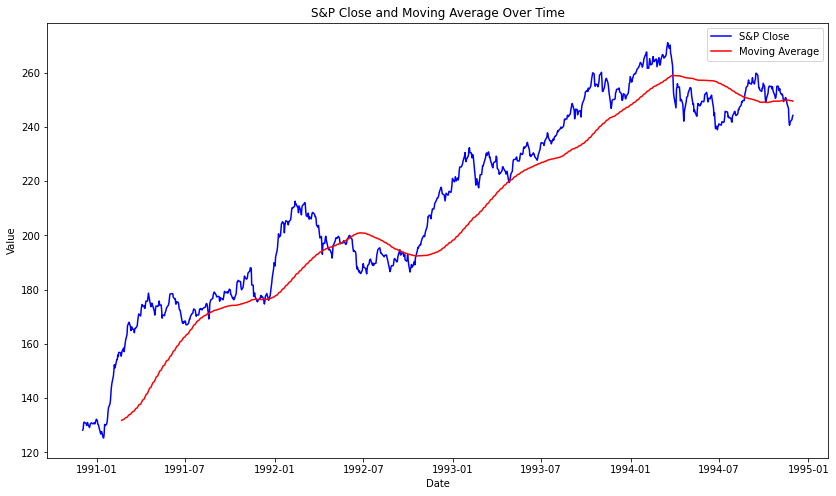

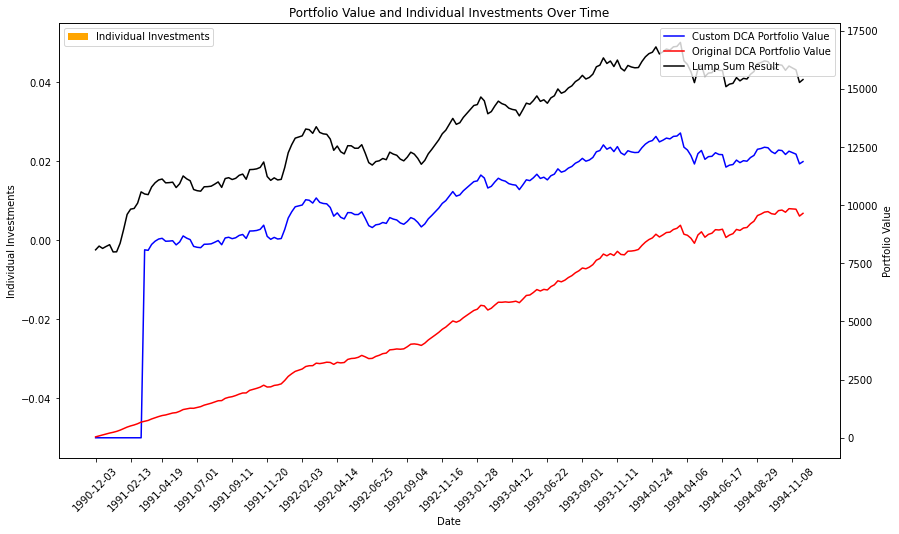

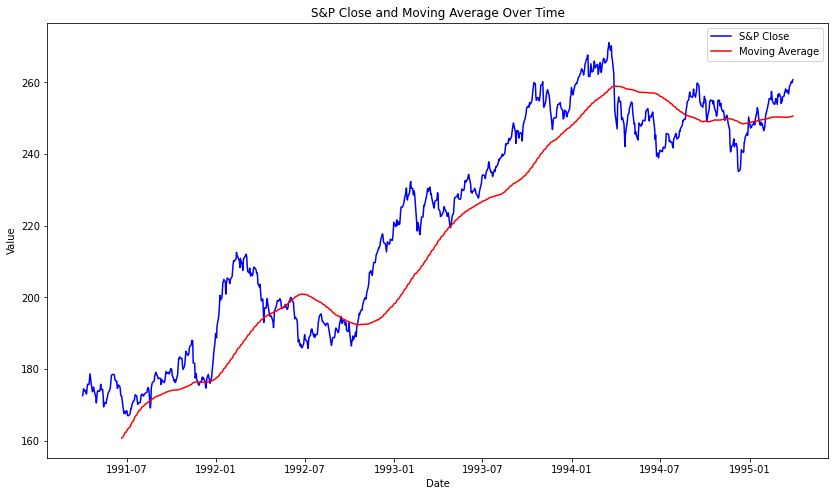

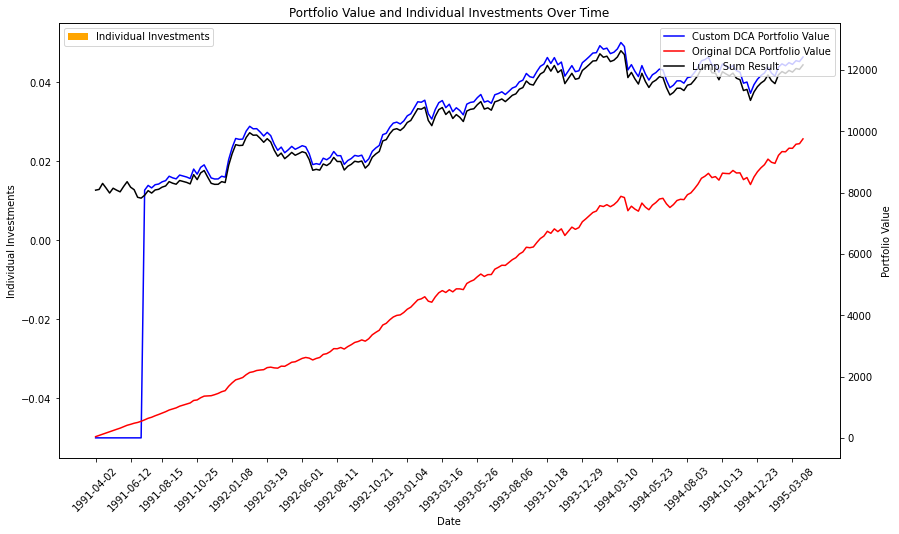

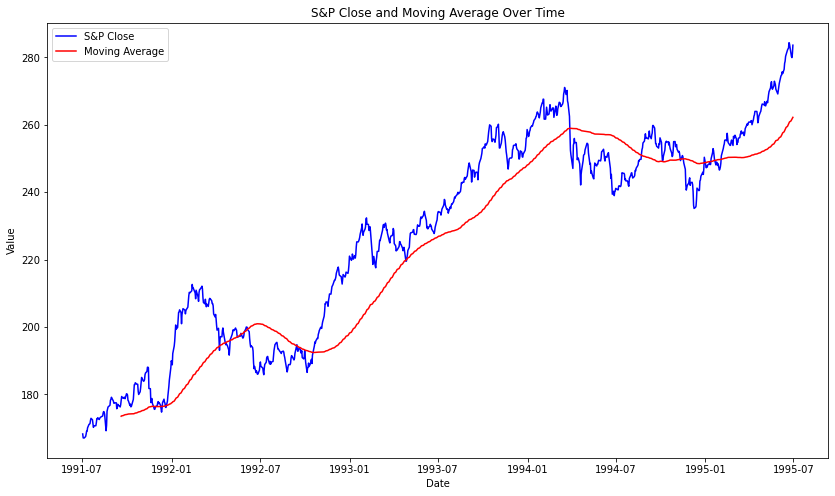

...

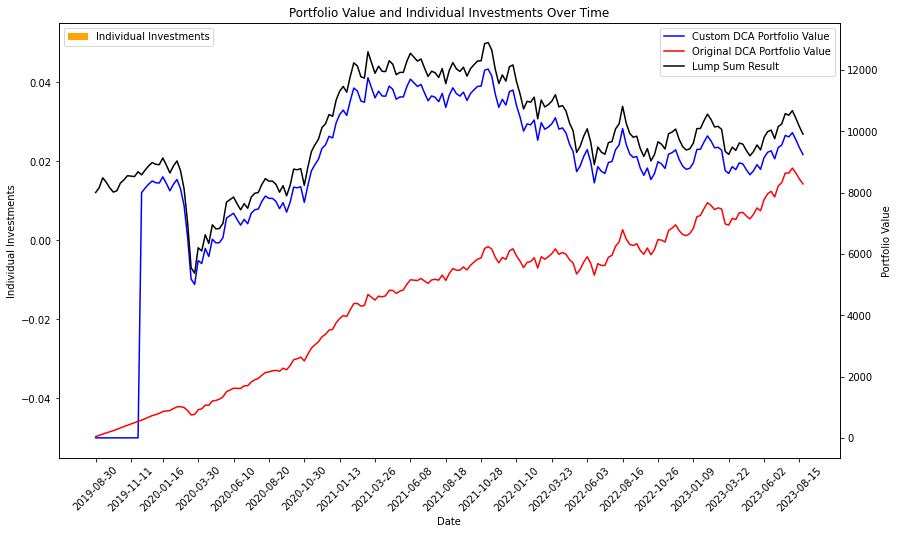

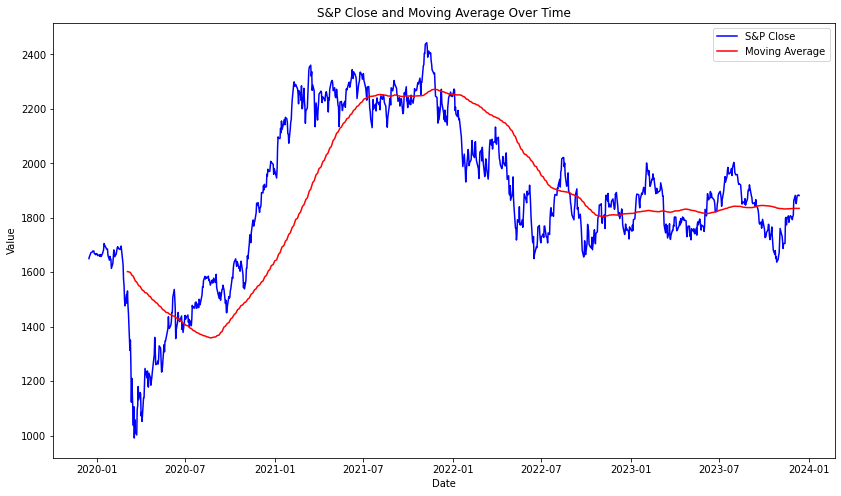

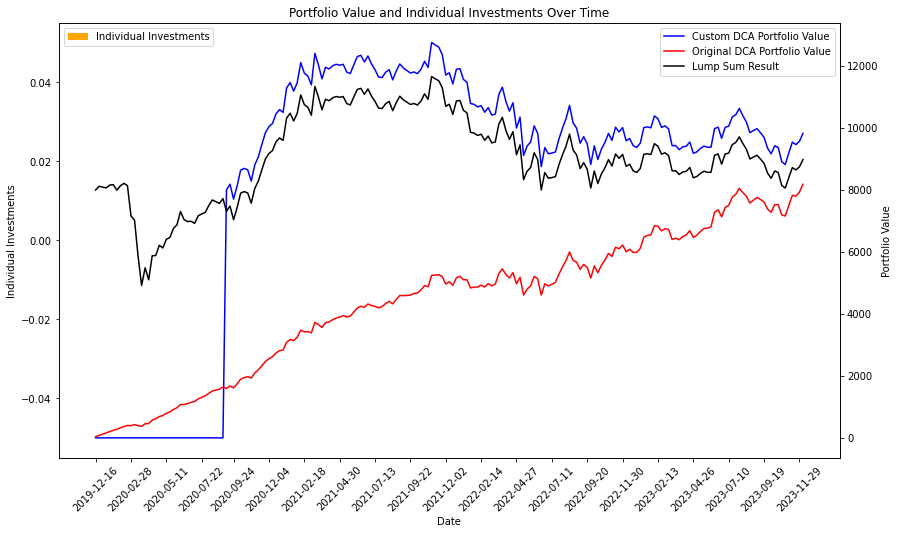

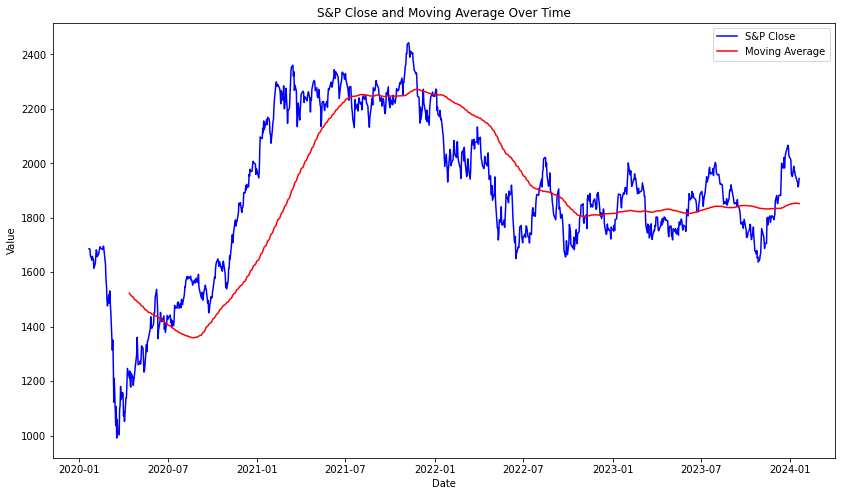

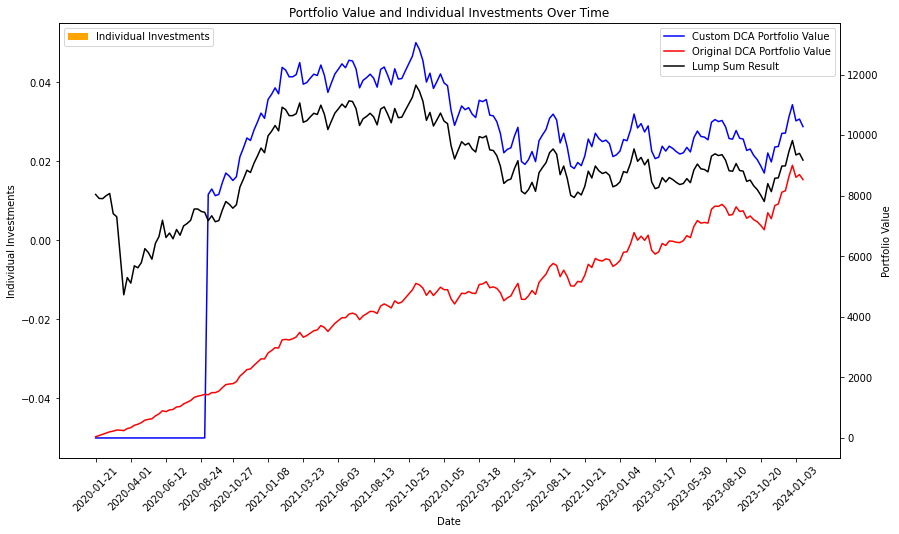

Slope:  -1.5     MovingAverage:  125    DaysVal:  2
0.9609565450843743


0.9609565450843743

In [315]:
make_plots(moving_average=125, slope_val=-1.5,days_val = 2)